In [1]:
import os
import glob
import yaml
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gymnasium as gym
import imageio
from pathlib import Path
from IPython.display import Image, display

In [2]:
def layer_init(layer, std=np.sqrt(2), bias_const=0.0):
    torch.nn.init.orthogonal_(layer.weight, std)
    torch.nn.init.constant_(layer.bias, bias_const)
    return layer


class PPOAgent(nn.Module):
    def __init__(self, obs_dim, action_dim):
        super().__init__()
        self.actor_mean = nn.Sequential(
            layer_init(nn.Linear(obs_dim, 64)), nn.Tanh(),
            layer_init(nn.Linear(64, 64)),      nn.Tanh(),
            layer_init(nn.Linear(64, action_dim), std=0.01),
        )

    def get_action(self, obs):
        return self.actor_mean(obs)  # deterministic mean


class SACActorNet(nn.Module):
    def __init__(self, obs_dim, action_dim, action_scale, action_bias):
        super().__init__()
        self.fc1 = nn.Linear(obs_dim, 256)
        self.fc2 = nn.Linear(256, 256)
        self.fc_mean = nn.Linear(256, action_dim)
        self.fc_logstd = nn.Linear(256, action_dim)
        self.register_buffer("action_scale", action_scale)
        self.register_buffer("action_bias",  action_bias)

    def get_action(self, obs):
        x = F.relu(self.fc1(obs))
        x = F.relu(self.fc2(x))
        return torch.tanh(self.fc_mean(x)) * self.action_scale + self.action_bias

In [3]:
def _detect_alg(run_dir):
    for part in Path(run_dir).parts:
        if part in ("ppo", "sac"):
            return part
    raise ValueError(f"Cannot detect algorithm from path: {run_dir}")


def load_agent(run_dir, device="cpu"):
    """Load PPO or SAC agent from a run directory containing model.pt + config.yaml."""
    cfg = yaml.safe_load(open(os.path.join(run_dir, "config.yaml")))
    env_id  = cfg["env_id"]
    alg     = _detect_alg(run_dir)
    data    = torch.load(os.path.join(run_dir, "model.pt"), map_location=device,weights_only=False)

    tmp_env    = gym.make(env_id)
    obs_dim    = int(np.prod(tmp_env.observation_space.shape))
    action_dim = int(np.prod(tmp_env.action_space.shape))

    if alg == "ppo":
        agent   = PPOAgent(obs_dim, action_dim).to(device)
        # strict=False: the saved dict also contains critic/actor_logstd which we don't need for inference
        agent.load_state_dict(data["state_dict"], strict=False)
        obs_rms = data.get("obs_rms")          # dict with 'mean' and 'var', or None
        tmp_env.close()
        return agent, env_id, alg, obs_rms

    else:  # sac
        a_scale = torch.tensor(
            (tmp_env.action_space.high - tmp_env.action_space.low) / 2.0,
            dtype=torch.float32)
        a_bias  = torch.tensor(
            (tmp_env.action_space.high + tmp_env.action_space.low) / 2.0,
            dtype=torch.float32)
        actor = SACActorNet(obs_dim, action_dim, a_scale, a_bias).to(device)
        actor.load_state_dict(data)
        tmp_env.close()
        return actor, env_id, alg, None


def render_episode(agent, env_id, alg, obs_rms=None, device="cpu", max_steps=1000):
    """Roll out one episode and return a list of RGB frames."""
    env = gym.make(env_id, render_mode="rgb_array")
    obs, _ = env.reset()
    frames, total_reward = [], 0.0

    for _ in range(max_steps):
        frames.append(env.render())

        if obs_rms is not None:              # PPO: normalise observation
            obs = (obs - obs_rms["mean"]) / np.sqrt(obs_rms["var"] + 1e-8)
            obs = np.clip(obs, -10, 10)

        obs_t = torch.tensor(obs, dtype=torch.float32, device=device).unsqueeze(0)
        with torch.no_grad():
            action = agent.get_action(obs_t).cpu().numpy()[0]

        obs, reward, terminated, truncated, _ = env.step(action)
        total_reward += reward
        if terminated or truncated:
            break

    env.close()
    print(f"  Episode return: {total_reward:.2f}  ({len(frames)} frames)")
    return frames,total_reward


def save_gif_and_display(frames, path, fps=30):
    """Save frames as an animated GIF and display inline."""
    duration_ms = 1000 / fps  # imageio v2.5+ uses duration in ms per frame
    imageio.mimwrite(path, [f.astype(np.uint8) for f in frames], duration=duration_ms, loop=0)
    display(Image(filename=path))


## To render a policy add you run below

In [4]:
OUTPUT_DIR  = "..\\output\\HalfCheetah-v4\\sac\\20260326_232205_seed1"# add your path to the run you want to visualize
ENV_ID      = "HalfCheetah-v4"   # Change to your environment
DEVICE      = "cpu" # If you have a gpu you can use it
MAX_STEPS   = 1000
FPS         = 60 # Toggle for sped
ALG         = "sac"
print(f"Output dir : {OUTPUT_DIR}")

Output dir : ..\output\HalfCheetah-v4\sac\20260326_232205_seed1


  Episode return: 9269.43  (1000 frames)


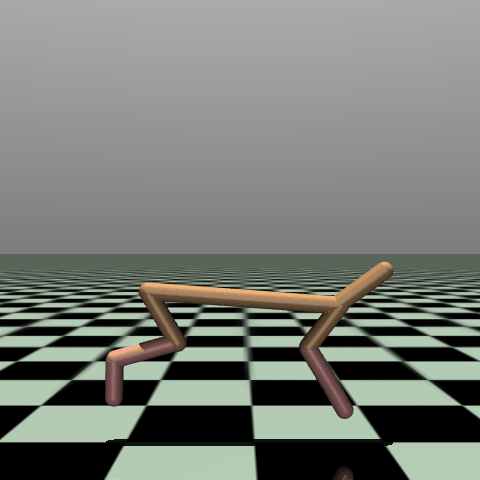

In [29]:
agent, env_id, alg, obs_rms = load_agent(OUTPUT_DIR, device=DEVICE)
frames,reward = render_episode(agent, env_id, alg, obs_rms=obs_rms, device=DEVICE, max_steps=MAX_STEPS)
save_gif_and_display(frames, f"{ENV_ID}_{ALG}_02.gif", fps=FPS)

In [77]:
path = "..\\output\\HalfCheetah-v4\\ppo\\"
folder_list = os.listdir(path)


for i, name in enumerate(folder_list):
    print(f"[{i}] - {name}")

idx = int(input("Choose file index: "))

OUTPUT_DIR = path+"\\"+folder_list[idx]
print(f"Output dir : {OUTPUT_DIR}")

[0] - 20260320_213052_seed1
[1] - 20260320_221946_seed1
[2] - 20260320_230736_seed1
[3] - 20260321_001346_seed1
[4] - 20260321_010331_seed1
[5] - 20260321_015208_seed1
[6] - 20260321_024226_seed1
[7] - 20260321_033120_seed1
[8] - 20260321_042011_seed1
Output dir : ..\output\HalfCheetah-v4\ppo\\20260320_221946_seed1


In [37]:
import yaml

In [9]:
#ppo_run = latest_run(OUTPUT_DIR, ENV_ID, "ppo")

path = "..\\output\\HalfCheetah-v4\\ppo\\"
num_trails = 10   # TODO: average over more trials 

collection = dict()

for j in os.listdir(path):
    with open(path+j+'\\config.yaml') as f:
        config = yaml.safe_load(f)
    OUTPUT_DIR = path+j
    print(f"Loading Agent from: {OUTPUT_DIR}")
    print(f"CONFIG: epsilon = {config['clip_coef']}, lambda = {config['gae_lambda']}")
    agent, env_id, alg, obs_rms = load_agent(OUTPUT_DIR, device=DEVICE)
    reward_sum = 0
    for i in range(num_trails):
        frames,reward = render_episode(agent, env_id, alg, obs_rms=obs_rms, device=DEVICE, max_steps=MAX_STEPS)
        reward_sum+=reward
        # save_gif_and_display(frames, f"{ENV_ID}_{ALG}_02.gif", fps=FPS)

    collection[(config['clip_coef'], config['gae_lambda'])] = reward_sum/num_trails

    print(f"Average Return over {num_trails} episodes agent({j}): {reward_sum/num_trails:.2f}")

Loading Agent from: ..\output\HalfCheetah-v4\ppo\20260320_213052_seed1
CONFIG: epsilon = 0.1, lambda = 0.9
  Episode return: 1446.03  (1000 frames)
  Episode return: 1482.83  (1000 frames)
  Episode return: 1456.03  (1000 frames)
  Episode return: 1491.95  (1000 frames)
  Episode return: 1519.01  (1000 frames)
  Episode return: 1476.77  (1000 frames)
  Episode return: 1429.83  (1000 frames)
  Episode return: 1471.59  (1000 frames)
  Episode return: 1426.20  (1000 frames)
  Episode return: 1485.37  (1000 frames)
Average Return over 10 episodes agent(20260320_213052_seed1): 1468.56
Loading Agent from: ..\output\HalfCheetah-v4\ppo\20260320_221946_seed1
CONFIG: epsilon = 0.1, lambda = 0.95
  Episode return: 1389.31  (1000 frames)
  Episode return: 1346.00  (1000 frames)
  Episode return: 1421.35  (1000 frames)
  Episode return: 1380.46  (1000 frames)
  Episode return: 1372.68  (1000 frames)
  Episode return: 1357.45  (1000 frames)
  Episode return: 1330.73  (1000 frames)
  Episode return: 

In [10]:
collection

{(0.1, 0.9): np.float64(1468.5611358597862),
 (0.1, 0.95): np.float64(1388.2623178804292),
 (0.1, 1.0): np.float64(1607.0554846095722),
 (0.2, 0.9): np.float64(4437.337810964097),
 (0.2, 0.95): np.float64(2464.425940863309),
 (0.2, 1.0): np.float64(2417.578540314357),
 (0.3, 0.9): np.float64(701.5173884665353),
 (0.3, 0.95): np.float64(4549.771744719895),
 (0.3, 1.0): np.float64(159.54406023565207)}

In [2]:
def gen_command(algo: str):
    if algo == 'ppo':
        epsilon_vals = [0.1,0.2,0.3]
        lambda_vals = [0.9,0.95,1]

        command = ""                                        
        for i in epsilon_vals:
            for j in lambda_vals:
                if command == "":
                    command+=f"python ./agents/ppo.py --clip_coef={i} --gae_lambda={j}"
                else:
                    command+=f" && python ./agents/ppo.py --clip_coef={i} --gae_lambda={j}"
        return command
    elif algo == 'sac':
        command = ""
        gamma_vals = [0.90,0.95,0.99]
        tau_vals = [0.005,0.01,0.05]

        for i in gamma_vals:
            for j in tau_vals:
                if command == "":
                    command+=f"python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma={i} --tau={j}"
                else:
                    command+=f" && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma={i} --tau={j}"

        return command
    else:
        return "Unrecognized Value of 'algo' parameter"

gen_command(algo='sac')

"python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.9 --tau=0.005 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.9 --tau=0.01 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.9 --tau=0.05 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.95 --tau=0.005 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.95 --tau=0.01 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.95 --tau=0.05 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.99 --tau=0.005 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.99 --tau=0.01 && python ./agents/sac.py --env_id='HalfCheetah-v4' --gamma=0.99 --tau=0.05"